# Simpsons network

In this notebook we will work with the social network that is present in the Simpsons series. For those of you that haven't seen the Simpsons or just haven't gotten the "point" of the series, then it's about a typical American family living a typical American life facing typical problems. The series have been extremly popular for the past 30 years due to its realistic representation of the real life as well as way of addressing real life issues, whether it's political, climate, societal, through a typical person's eyes in a comical way. <img src="./images/simpsons-intro.jpg" alt="drawing" width="600"/>

In this projcet we will try to analyze whether the Simpsons are realistically representing the typical (American) life. We will do this by doing the following: 
- Finding communities and compare the communities with each other. 
- Compare the characters from different life stages (Children, Adults, Seniors).
- Find hidden groups in the network by grouping characters based on their personalities and not their relations.

For the above, we will need some data of each of the characters in the series. This data we can find on the [Simpsons Wiki](https://simpsons.fandom.com/wiki/Simpsons_Wiki) where you can find a wiki page of each character, location and episode. Moreover, we will use a [transcript dataset](https://www.kaggle.com/pierremegret/dialogue-lines-of-the-simpsons) which consists of millions of dialogue lines of different characters. The transcript dataset however, does not contain all lines and thus there will be no data on some characters. 

# Data Collection (Edin)
## Wiki data

### Character names & roles
First, we start by collecting data from all the characters in the episodes. By inspecting this [page](https://simpsons.fandom.com/wiki/Portal:All_Simpson_Characters) one will see that some characters are split into different roles and families. E.g. Bart Simpson is in Major Characters, Simpsons Family and School Student. We will therefore begin by making a dict where we collect all characters as keys and the roles and families that each character belongs to as the value. 

In [1]:
import re
import pandas as pd
import numpy as np
import re
import urllib
import json
import os
from urllib.parse import quote 

In [817]:
def get_characters():
    base_url = 'https://simpsons.fandom.com/api.php?'
    action = 'action=query'
    title = 'titles=Portal:All_Simpson_Characters'
    content = 'prop=revisions&rvprop=content&rvslots=*'
    dataformat = 'format=json'
    query_url = '{}{}&{}&{}&{}'.format(base_url, action, content, title, dataformat)

    fp = urllib.request.urlopen(query_url)
    mybytes = fp.read()
    decoding = mybytes.decode("utf8")
    json_file = json.loads(decoding)
    fp.close()
    
    content = json_file['query']['pages']['51112']['revisions'][0]['slots']['main']['*']
    character_pattern = r'\|(?:\'\')?\[\[([\w \(\),.]+)\]\](?:\'\')?'
    header_pattern = r'==([\w\s]+)=='

    characters = re.findall(character_pattern, content)
    characters_dict = {character: {'role': [], 'family': []} for character in characters}
    headers = re.findall(header_pattern, content)
    
    for header, nextheader in zip(headers[:-1], headers[1:]):
        headercontent_pattern = r'===?{}===?[\w\W]+==?{}==?'.format(header, nextheader)
        header_content = re.findall(headercontent_pattern, content)
        header_characters = re.findall(character_pattern, header_content[0])
        [characters_dict[character]['family'].append(header) if 'Family' in header else characters_dict[character]['role'].append(header) for character in header_characters] 
    
    return characters_dict

Now we can save all the characters to a csv file that we call "all_characters.csv". 

In [818]:
characters_dict = get_characters()
characters_df = pd.DataFrame.from_dict(characters_dict, orient='index')
characters_df.index.names = ['Name']
characters_df.to_csv('./files/all_characters.csv')

In [819]:
characters = pd.read_csv('./files/all_characters.csv')
characters.head()

,Name,role,family
0,Homer Simpson,['Main Characters'],['Simpson Family']
1,Marge Simpson,['Main Characters'],"['Simpson Family', 'Bouvier Family']"
2,Bart Simpson,"['Main Characters', 'School Students']",['Simpson Family']
3,Lisa Simpson,"['Main Characters', 'School Students']",['Simpson Family']
4,Maggie Simpson,['Main Characters'],['Simpson Family']


### Character wiki description
Now by having the names of all characters in the series, we can collect the wiki page of each character. This is what is done by the following code where we make an API call and retrieve the html of each characther's wiki content. If a character does not have a wiki page (and a few of them doesn't) then we update the all_characters.csv file by deleting the specific character from the csv file.  

In [820]:
def write_charactercontent2txt(name):
    character_name = re.sub(' ', '_', name)
    base_url = 'https://simpsons.fandom.com/api.php?'
    action = 'action=query'
    title = 'titles={}'.format(quote(character_name))
    content = 'prop=revisions&rvprop=content&rvslots=*'
    dataformat = 'format=json'
    query_url = '{}{}&{}&{}&{}'.format(base_url, action, content, title, dataformat)
    
    fp = urllib.request.urlopen(query_url)
    mybytes = fp.read()
    decoding = mybytes.decode("utf8")
    json_file = json.loads(decoding)
    fp.close()
    try:
        character_content = list(json_file['query']['pages'].values())[0]['revisions'][0]['slots']['main']['*']
        if "#REDIRECT" in character_content.upper():
            new_name = re.findall('\[\[([\w.\,^: ]+)\]\]', character_content)[0]
            
            characters_df = pd.read_csv('./files/all_characters.csv')
            characters_df.Name[characters_df.Name == name] = new_name
            characters_df.to_csv('./files/all_characters.csv', index=False)
            print('Name of character has been updated from {} to {}'.format(name, new_name))
            return write_charactercontent2txt(new_name)
        elif '{{Delete}}' in character_content:
            characters_df = pd.read_csv('./files/all_characters.csv')
            characters_df = characters_df[characters_df.Name != name]
            characters_df.to_csv('./files/all_characters.csv', index=False)
            print('No Page of {}. {} Has been removed from characters.csv'.format(name, name))

        file_path = 'files/character_description/{}.txt'.format(character_name)
        text_file = open(file_path, "w")
        text_file.write(character_content)
        text_file.close()
        #print('Content of character {} written to file {}'.format(name, file_path))
    except:
        characters_df = pd.read_csv('./files/all_characters.csv')
        characters_df = characters_df[characters_df.Name != name]
        characters_df.to_csv('./files/all_characters.csv', index=False)
        print('No Page of {}. {} Has been removed from characters.csv'.format(name, name))

In [821]:
for name in characters.Name:
    write_charactercontent2txt(name)

Name of character has been updated from Jasper Beardly to Jasper Beardsley
Name of character has been updated from Disco Stu to Stu Discothèque
No Page of Jonathan Frink. Jonathan Frink Has been removed from characters.csv
Name of character has been updated from Julio to Julio Franco
Name of character has been updated from Roger Meyers, Jr. to Roger Meyers Jr.
Name of character has been updated from Martin Prince to Martin Prince, Jr
Name of character has been updated from Principal Dondelinger to Harlan Dondelinger
Name of character has been updated from The Rich Texan to Shady Bird Johnson
Name of character has been updated from Ms. Samson to Mrs. Samson
Name of character has been updated from Timothy Lovejoy, Jr. to Timothy Lovejoy Jr.
Name of character has been updated from Abbie Simpson to Abbey
No Page of Jenda Simpson. Jenda Simpson Has been removed from characters.csv
No Page of Prison Snitch (Simpson Relative). Prison Snitch (Simpson Relative) Has been removed from characters.

### Extract relations & categories
From each character we can extract its (outgoing relations). I.e. all the references to other characters in the Simpsons universe from each character's wiki page. Also, in the bottom of each characther's wiki page, e.g. [Homer](https://simpsons.fandom.com/wiki/Homer_Simpson), there is a list of categories that the character has been put into. These categories from 'Child', 'Alcholic', 'Mother' etc. and thus interesting pieces of information when comparing multiple characters with each other. Therefore, in this part, we will extract the relations and the categories of each character and write these to a seperate files 'relations/character.csv' and 'categories/character.csv'.

In [822]:
characters = pd.read_csv('./files/all_characters.csv')

In [823]:
def get_character_content(character_name):
    file = './files/character_description/{}.txt'.format(character_name)
    with open(file, 'r') as f:
        character_content = f.read()
    return character_content

In [824]:
def extract_relations(character_content):
    relation_pattern = "\[\[([\w\s]+)(?:\|[\w\s]+)?\]\]"
    relations = re.findall(relation_pattern, character_content)
    return relations

In [825]:
def extract_categories(character_content):
    category_pattern = "\[\[Category:([\w\s]+)\]\]"
    categories = re.findall(category_pattern, character_content)
    return categories

In [826]:
characterlist_sorted = sorted(characters.Name)
for character_name in characters.Name:
    character_name = re.sub(' ', '_', character_name)
    character_content = get_character_content(character_name)
    
    relations = extract_relations(character_content)
    relations = [re.sub(' ', '_', character) for character in set(relations) if character in characterlist_sorted]
    
    categories = extract_categories(character_content)
    
    with open('./files/character_relations/{}.txt'.format(character_name), 'w') as f:
        for relation in relations:
            f.write("{}\n".format(relation))
            
    with open('./files/character_categories/{}.txt'.format(character_name), 'w') as f:
        for category in categories:
            f.write("{}\n".format(category))
        
    #print('Completed Category and Relation extraction for {}'.format(character_name))

## Transcript Data

Now we have the data from the wiki pages nicely ordered. We're just missing to clean the data of the transcript dataset. If you're too lazy to scroll up, then it is the dataset that can be found [here](https://www.kaggle.com/pierremegret/dialogue-lines-of-the-simpsons) and is a dataset consisting of the diaglogue lines of many different characters (not from everybody, however). 
If one reads in the data we will notice one big issue. 

In [12]:
data = pd.read_csv('./files/simpsons_dataset.csv')
data.head()

,raw_character_text,spoken_words
0,Miss Hoover,"No, actually, it was a little of both. Sometim..."
1,Lisa Simpson,Where's Mr. Bergstrom?
2,Miss Hoover,I don't know. Although I'd sure like to talk t...
3,Lisa Simpson,That life is worth living.
4,Edna Krabappel-Flanders,The polls will be open from now until the end ...


Unless you are willing to read all the names from the characters.csv file, the issue may not be apperant. Above you see the some characters have different names in the "raw_character_text" column compared to the names that are written to the characters.csv file. E.g. Miss Hoover is actually called Elizabeth Hoover. And looking through the names, there are no general way of mapping the names from the raw_character_text column to the names from the characters.csv. Therefore, a quick solution is to make a dict on a handful of names (since it will be too time consuming to do it for everyone) and also because these characters are more popular than the other names that are mispelled. 

In [827]:
characters_df = pd.read_csv('./files/all_characters.csv')

In [828]:
data.rename(columns={'raw_character_text': 'Name'}, inplace=True)
counts = data.Name.value_counts().to_frame(name='Counts')
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    counts = counts[counts.Counts > 100]
    print(counts[~counts.index.isin(characters_df.Name)].sort_values('Counts', ascending=False))

                             Counts
Dr. Julius Hibbert              691
Crowd                           540
Martin Prince                   409
Announcer                       387
Kids                            365
Jonathan Frink                  340
DOLPH                           201
Audience                        177
Narrator                        156
The Rich Texan                  153
Captain Horatio McCallister     146
HERB                            141
Adult Bart                      124
Man                             114
Woman                           105
TROY                            101


In [15]:
name_mapper = {
                'Grampa Simpson': 'Abraham Simpson II',
                'C. Montgomery Burns': 'Charles Montgomery Burns',
                'Waylon Smithers': 'Waylon Smithers, Jr.',
                'BROCKMAN' : 'Kent Brockman',
                'Chief Wiggum' : 'Clancy Wiggum',
                'Sideshow Bob' : 'Robert Terwilliger',
                'Sideshow Mel' : 'Melvin Van Horne',
                'Dr. Julius Hibbert ' : 'Julius Hibbert',
                'Dr. Nick Riviera' : 'Nick Riviera',
                'Edna Krabappel-Flanders' : 'Edna Krabappel',
                'Mayor Joe Quimby': 'Joe Quimby',
                'Miss Hoover' : 'Elizabeth Hoover',
                'Professor Jonathan Frink':'Jonathan Frink',
                'Rev. Timothy Lovejoy' : 'Timothy Lovejoy Jr.',
                'Jasper Beardly' : 'Jasper Beardsley',
                'Judge Snyder': 'Roy Snyder',
                'Louie': 'Louie (mafia)',
                'Luigi': 'Luigi Risotto',
                'Dr. Marvin Monroe': 'Marvin Monroe',
                'Roger Meyers, Jr.': 'Roger Meyers Jr',
                'Bumblebee Man': 'Pedro Chespirito',
                'Dr. J. Loren Pyror': 'J. Loren Pryor',
                'Principal Dondelinger': 'Harlan Dondelinger',
                'Disco Stu': 'Stu Discothèque',
                'KRABAPPEL': 'Edna Krabappel'
              }

In [16]:
keys = list(name_mapper.keys())
data.Name[data.Name.isin(keys)] = data.Name[data.Name.isin(keys)].apply(lambda x : name_mapper[x])

In [17]:
data.to_csv('./files/simpsons_dataset_cleaned.csv', index=False)

# Network Statistics (Edin)

In this part, we will find basic statistics of the network such as the network size, degree distributions and find central nodes. 

In [18]:
import networkx as nx
from ast import literal_eval
import forceatlas2
import matplotlib.pyplot as plt
import seaborn as sns
import powerlaw
import os
import matplotlib

In [19]:
num_files = len(os.listdir('./files/character_description')) +  len(os.listdir('./files/character_categories')) + len(os.listdir('./files/character_relations')) + 2
print('Number of data files:: {}'.format(num_files))

Number of data files:: 2361


We start by actually making the network. It is a directed network where an outgoing link for node $n_i$ to $n_j$ means that the wiki page of character $n_i$ has made a reference to character $n_j$. 

In [831]:
characters_df = pd.read_csv('./files/all_characters.csv', converters={'COLUMN_NAME': pd.eval})
characters_df.role = characters_df.role.apply(lambda x: literal_eval(x))
characters_df.family = characters_df.family.apply(lambda x: literal_eval(x))

In [832]:
G = nx.DiGraph()
characters_df.apply(lambda x: G.add_node(x.Name, role=x.role, family=x.family), axis=1)
for character in characters_df.Name:
    with open('files/character_relations/'+re.sub(' ', '_', character)+'.txt', 'r') as f:
        character_relations = f.read()
    [G.add_edge(character, re.sub('_', ' ', neighbor)) for neighbor in character_relations.split('\n') if neighbor != '' and re.sub('_', ' ', neighbor) != character]

print('Number of nodes in the network:: {}'.format(len(G.nodes())))
print('Number of edges in the network:: {}'.format(len(G.edges())))

Number of nodes in the network:: 753
Number of edges in the network:: 3835


In [833]:
G0_nodes = max(nx.weakly_connected_components(G), key=len)
G0 = G.subgraph(G0_nodes)
print('Number of nodes in GCC:: {}'.format(len(G0.nodes())))
print('Number of edges in GCC: {}'.format(len(G0.edges())))

Number of nodes in GCC:: 635
Number of edges in GCC: 3833


In [23]:
positions = forceatlas2.forceatlas2_networkx_layout(G0.to_undirected(), pos=None, niter=1000, outboundAttractionDistribution=False, edgeWeightInfluence=1.5, scalingRatio=1, gravity=20)

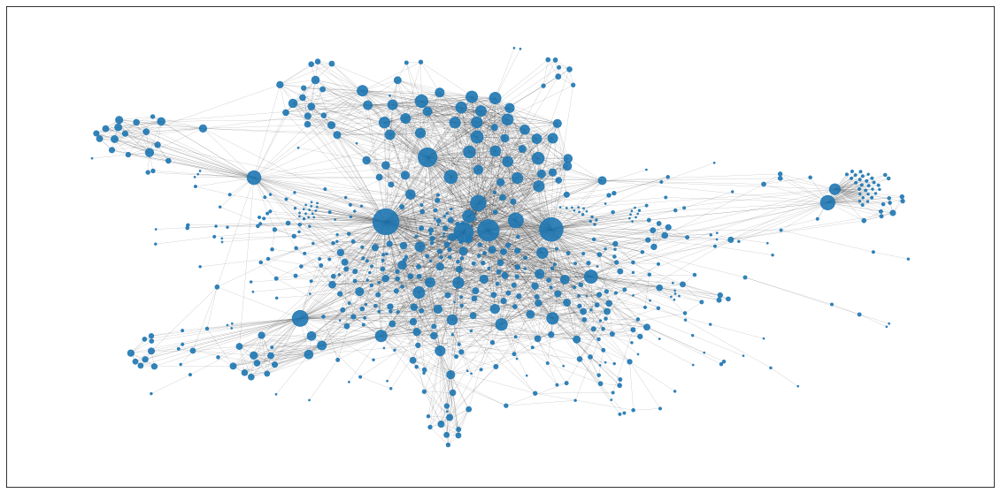

In [24]:
node_sizes = [G0.degree(node)*3 for node in G0.nodes()]
plt.rcParams["figure.figsize"] = (20,10)
nx.draw_networkx_nodes(G0.to_undirected(), positions, node_size=node_sizes, alpha=0.9)
nx.draw_networkx_edges(G0.to_undirected(), positions, width=0.2, alpha=0.4)
plt.draw()

The network seen above is the greatest connected component in the social network in the Simpsons Universe which consists of 599 nodes and 3641 edges. 

## Degree analysis

Now we will analyze the degree distributions and check whether the network can be modelled as a random network or as a social network that follows a powerlaw distribution. 

In [25]:
in_degrees = np.array([G.in_degree(node) for node in G.nodes()])
out_degrees = np.array([G.out_degree(node) for node in G.nodes()])
degrees = np.array([G.degree(node) for node in G.nodes()])

print('Average degree:: {}'.format(round(np.mean(degrees), 3)))

Average degree:: 10.199


### In degree Distribution

In [26]:
k = np.mean(in_degrees)
N = len(in_degrees)
p = k / (N - 1)

In [27]:
random_G = nx.generators.random_graphs.erdos_renyi_graph(p=p, n=N)
random_degrees = np.array([random_G.degree(node) for node in random_G.nodes()])

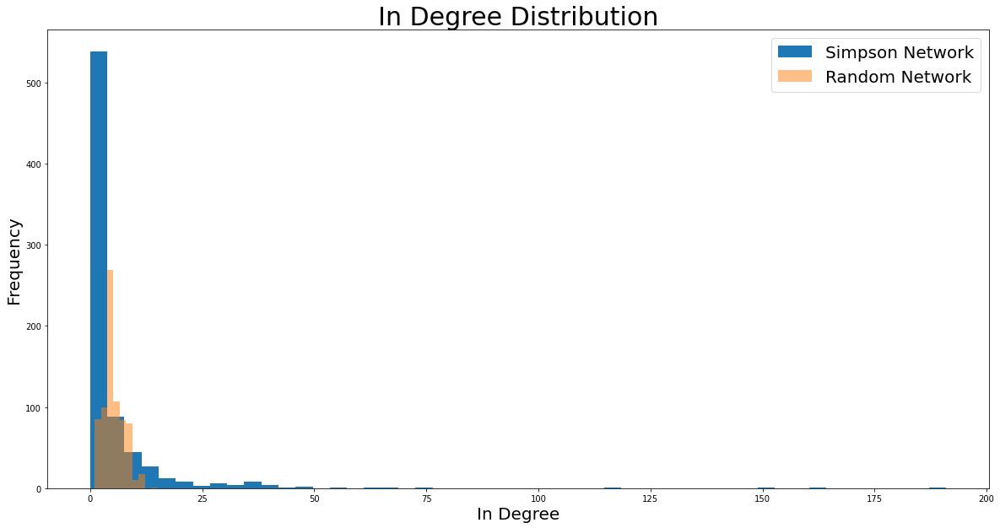

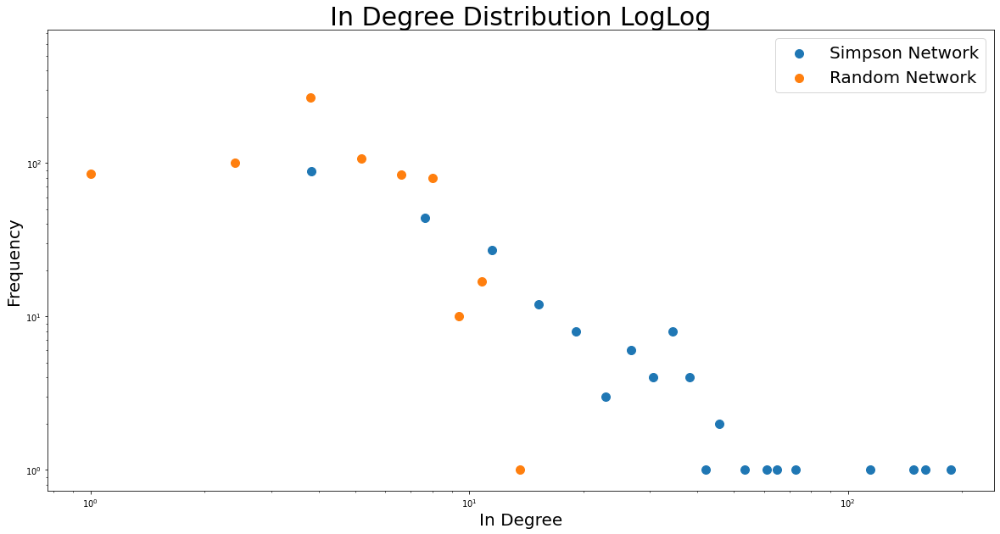

In [28]:
dens_random, bins_random = np.histogram(random_degrees)
dens, bins = np.histogram(in_degrees, bins=50)
plt.hist(in_degrees, bins=50, label='Simpson Network')
plt.hist(random_degrees, bins=10, alpha=0.5, label='Random Network')
plt.legend(fontsize=20)
plt.title('In Degree Distribution', fontsize=30)
plt.xlabel('In Degree', fontsize=20)
plt.ylabel('Frequency', fontsize=20)
plt.show()

plt.scatter(bins[:-1], dens, label='Simpson Network', s=100)
plt.scatter(bins_random[:-1], dens_random, label='Random Network', s=100)
plt.xscale('log')
plt.yscale('log')
plt.legend(fontsize=20)
plt.title('In Degree Distribution LogLog', fontsize=30)
plt.xlabel('In Degree', fontsize=20)
plt.ylabel('Frequency', fontsize=20)
plt.show()

The figure above shows that the in-degree distribution looks to follow a Powerlaw distribution and can therefore not be modelled as random network. 

### Out Degree Distribution

In [29]:
k = np.mean(out_degrees)
N = len(out_degrees)
p = k / (N - 1)

In [30]:
random_G = nx.generators.random_graphs.erdos_renyi_graph(p=p, n=N)
random_degrees = np.array([random_G.degree(node) for node in random_G.nodes()])

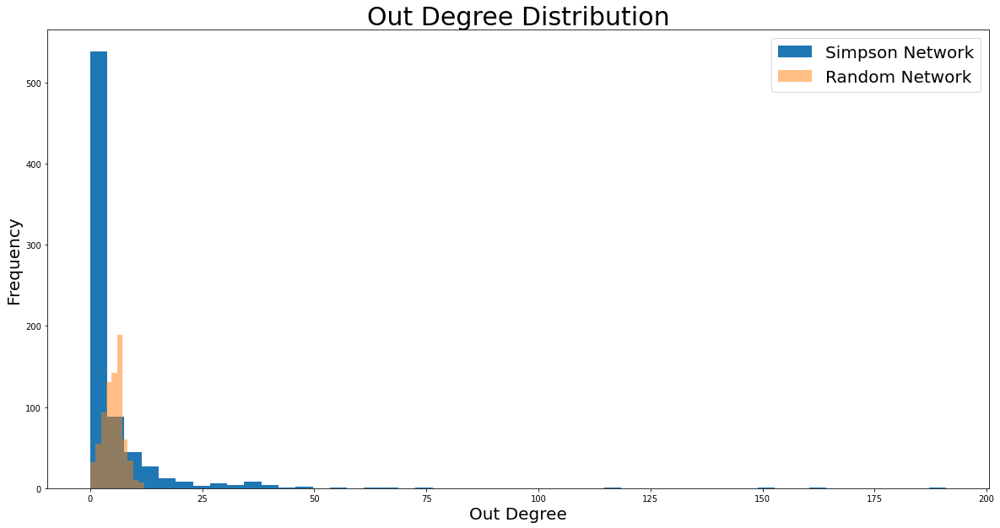

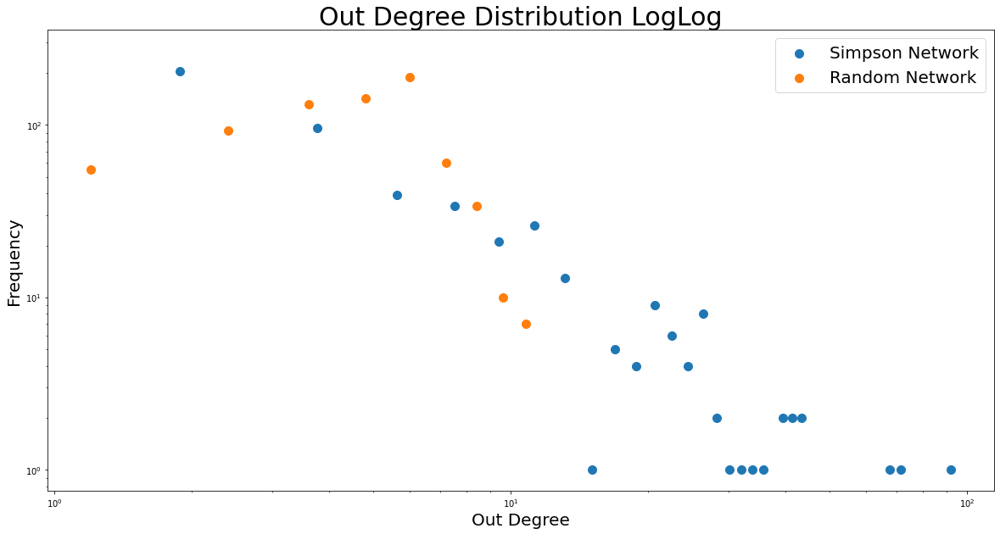

In [31]:
dens_random, bins_random = np.histogram(random_degrees)
dens, bins = np.histogram(out_degrees, bins=50)
plt.hist(in_degrees, bins=50, label='Simpson Network')
plt.hist(random_degrees, bins=10, alpha=0.5, label='Random Network')
plt.legend(fontsize=20)
plt.title('Out Degree Distribution', fontsize=30)
plt.xlabel('Out Degree', fontsize=20)
plt.ylabel('Frequency', fontsize=20)
plt.show()

plt.scatter(bins[:-1], dens, label='Simpson Network', s=100)
plt.scatter(bins_random[:-1], dens_random, label='Random Network', s=100)
plt.xscale('log')
plt.yscale('log')
plt.legend(fontsize=20)
plt.title('Out Degree Distribution LogLog', fontsize=30)
plt.xlabel('Out Degree', fontsize=20)
plt.ylabel('Frequency', fontsize=20)
plt.show()

The figure above shows that the out-degree distribution looks to follow a Powerlaw distribution and can therefore not be modelled as random network. 

### Degree Distribution

In [32]:
k = np.mean(degrees)
N = len(degrees)
p = k / (N - 1)

In [33]:
random_G = nx.generators.random_graphs.erdos_renyi_graph(p=p, n=N)
random_degrees = np.array([random_G.degree(node) for node in random_G.nodes()])

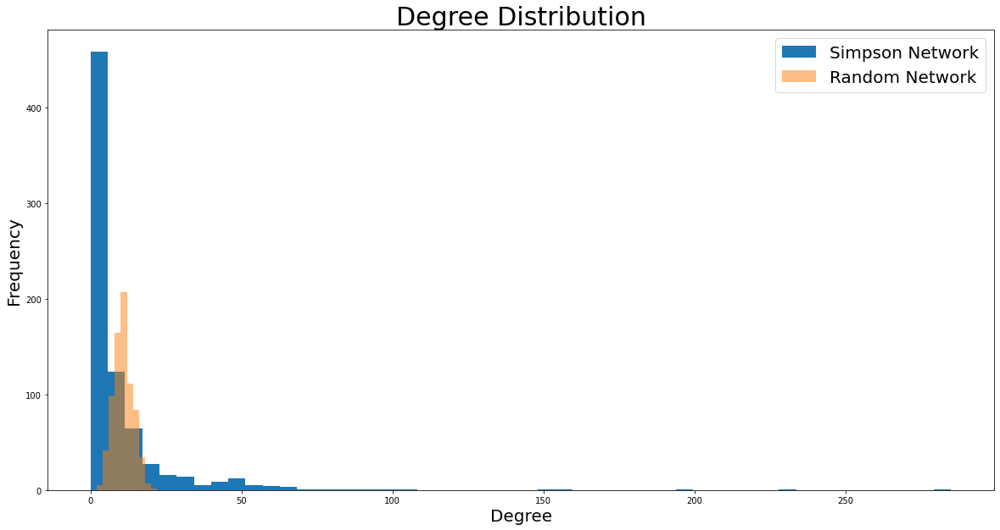

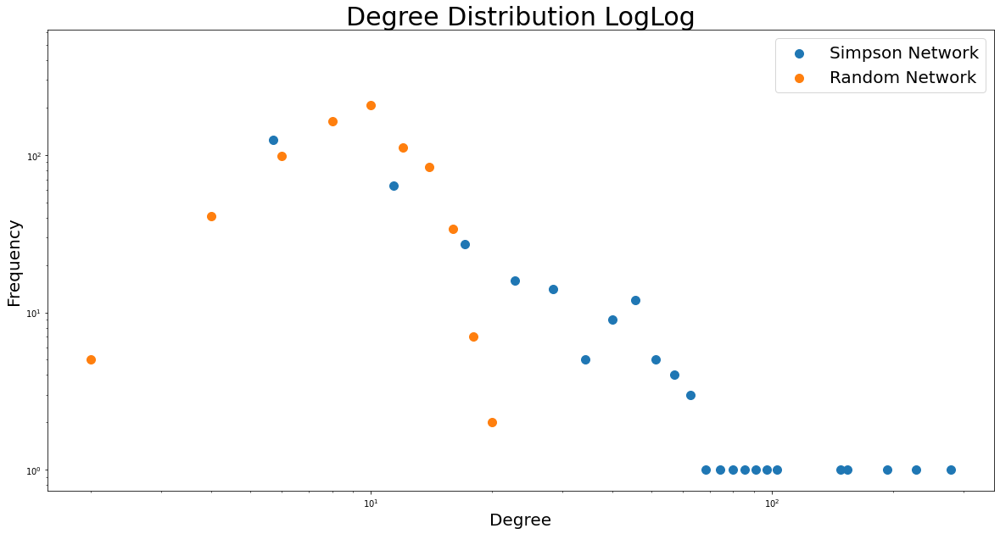

In [34]:
dens_random, bins_random = np.histogram(random_degrees)
dens, bins = np.histogram(degrees, bins=50)
plt.hist(degrees, bins=50, label='Simpson Network')
plt.hist(random_degrees, bins=10, alpha=0.5, label='Random Network')
plt.legend(fontsize=20)
plt.title('Degree Distribution', fontsize=30)
plt.xlabel('Degree', fontsize=20)
plt.ylabel('Frequency', fontsize=20)
plt.show()

plt.scatter(bins[:-1], dens, label='Simpson Network', s=100)
plt.scatter(bins_random[:-1], dens_random, label='Random Network', s=100)
plt.xscale('log')
plt.yscale('log')
plt.legend(fontsize=20)
plt.title('Degree Distribution LogLog', fontsize=30)
plt.xlabel('Degree', fontsize=20)
plt.ylabel('Frequency', fontsize=20)
plt.show()

The figure above shows that the degree distribution looks to follow a Powerlaw distribution and can therefore not be modelled as random network. 

### Degree Exponents

In [35]:
gamma_in = powerlaw.Fit(in_degrees).alpha
gamma_out = powerlaw.Fit(out_degrees).alpha
gamma = powerlaw.Fit(degrees).alpha
print('In-degree exponent:: {}'.format(round(gamma_in, 3)))
print('Out-degree exponent:: {}'.format(round(gamma_out, 3)))
print('Degree exponent:: {}'.format(round(gamma, 3)))

Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
Calculating best minimal value for power law fit
In-degree exponent:: 3.154
Out-degree exponent:: 3.879
Degree exponent:: 2.303


Values less than or equal to 0 in data. Throwing out 0 or negative values
Values less than or equal to 0 in data. Throwing out 0 or negative values
Values less than or equal to 0 in data. Throwing out 0 or negative values


Based on the exponent of the in/out degree distributions, we could argue that if we considered the network to be undirected and thus only focusing on the degree distribution, then that the Simpsons universe is a "ultra-small world". This means that there are some big hubs in the network that reduces the distnace between random nodes in the netowrk. Whereas the in-degree and out-degree has some random behavior and thus the distances between the nodes will greatly increase when the size of network scales. 

## Node Attribute Analysis

We know that there are many different categories. Now we'll count how many different categories there are and which that are the most common ones. 

In [834]:
characters_df = pd.read_csv('./files/all_characters.csv')
categories = pd.Series([], dtype=object)
for character in characters_df.Name:
    with open('files/character_categories/'+re.sub(' ', '_', character)+'.txt', 'r') as f:
        character_categories = f.read().split('\n')
        
    G.nodes[character]['categories'] = character_categories
    character_categories = pd.Series(character_categories)
    categories = categories.append(character_categories)

pd.set_option('display.max_rows', None)
cat_counts = categories.value_counts()
cat_counts_df = pd.DataFrame({'Category': cat_counts.index.tolist(), 'Counts': cat_counts.values, 'Frequency': np.round(cat_counts.values / len(characters_df), 2)})
cat_counts_df.head(20)

,Category,Counts,Frequency
0,,754,1.00
1,Characters,484,0.64
2,American Characters,450,0.60
3,Recurring characters,408,0.54
4,Citizens of Springfield,394,0.52
5,Adults,342,0.45
6,Male characters,320,0.42
7,Tapped Out Characters,284,0.38
8,Alive characters,238,0.32
9,Children,196,0.26


### Life Phases

In [37]:
print('Number of Seniors:: {}'.format(cat_counts_df[cat_counts_df.Category == 'Seniors'].Counts.values[0]))
print('Number of Adults:: {}'.format(cat_counts_df[cat_counts_df.Category == 'Adults'].Counts.values[0]))
print('Number of Children:: {}'.format(cat_counts_df[cat_counts_df.Category == 'Children'].Counts.values[0]))

Number of Seniors:: 90
Number of Adults:: 342
Number of Children:: 196


### Genders

In [38]:
print('Number of Men:: {}'.format(cat_counts_df[cat_counts_df.Category == 'Male characters'].Counts.values[0]))
print('Number of Women:: {}'.format(cat_counts_df[cat_counts_df.Category == 'Female characters'].Counts.values[0]))

Number of Men:: 319
Number of Women:: 166


# Network Visualization (Edin)

### Life Phases

In [39]:
sns.reset_orig

<function seaborn.rcmod.reset_orig()>

In [40]:
node_colors = ['forestgreen' if 'Seniors' in G0.nodes[node]['categories'] 
               else 'gold' if 'Adults' in G0.nodes[node]['categories'] 
               else 'maroon' if 'Children' in G0.nodes[node]['categories']
               else 'darkgray'for node in G0.nodes()]

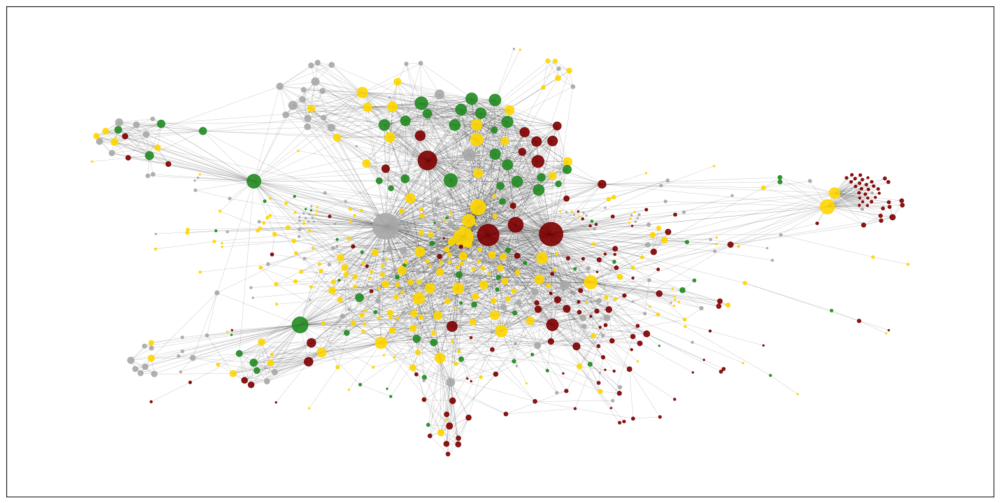

In [41]:
matplotlib.rc_file_defaults()
node_sizes = [G0.degree(node)*3 for node in G0.nodes()]
plt.rcParams["figure.figsize"] = (20,10)
nx.draw_networkx_nodes(G0.to_undirected(), positions, node_size=node_sizes, node_color=node_colors, alpha=0.9)
nx.draw_networkx_edges(G0.to_undirected(), positions, width=0.2, alpha=0.4)
plt.draw()

### Genders

In [42]:
node_colors = ['cyan' if 'Male characters' in G0.nodes[node]['categories'] 
               else 'deeppink' if 'Female characters' in G0.nodes[node]['categories'] 
               else 'darkgray'for node in G0.nodes()]

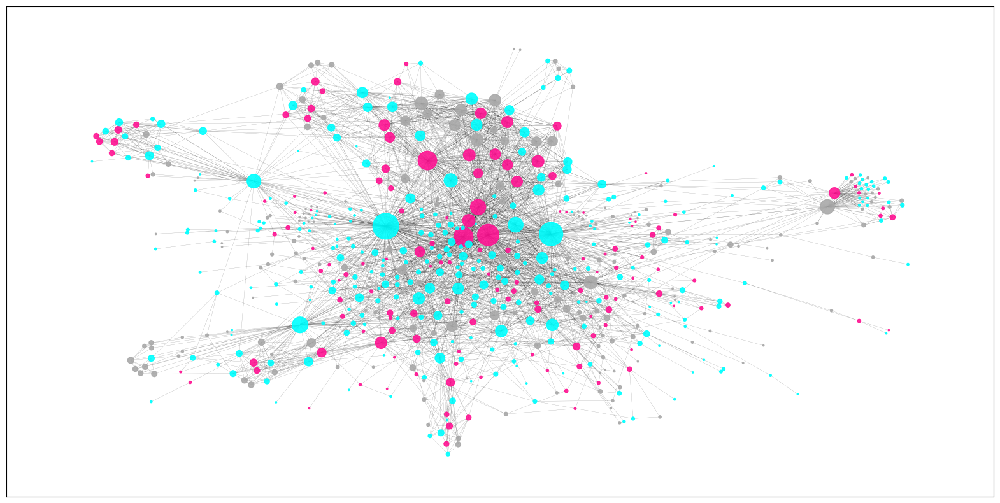

In [43]:
matplotlib.rc_file_defaults()
node_sizes = [G0.degree(node)*3 for node in G0.nodes()]
plt.rcParams["figure.figsize"] = (20,10)
nx.draw_networkx_nodes(G0.to_undirected(), positions, node_size=node_sizes, node_color=node_colors, alpha=0.9)
nx.draw_networkx_edges(G0.to_undirected(), positions, width=0.2, alpha=0.4)
plt.draw()

### Family

In [44]:
node_colors = [
               'purple' if len(G0.nodes[node]['family']) > 1
               else 'gold' if 'Simpson Family' in G0.nodes[node]['family'] 
               else 'forestgreen' if 'Flanders Family' in G0.nodes[node]['categories'] 
               else 'cornflowerblue' if 'Bouvier Family' in G0.nodes[node]['family']
               else 'black' if 'Burns Family' in G0.nodes[node]['family']
               else 'fuchsia' if 'Van Houten Family' in G0.nodes[node]['family']
               else 'chocolate' if 'Nahasapeemapetilon Family' in G0.nodes[node]['family']
               else 'bisque' if 'Krustofsky Family' in G0.nodes[node]['family']
               else 'midnightblue' if 'Skinner Family' in G0.nodes[node]['family']
               else 'orangered' if 'Muntz Family' in G0.nodes[node]['family']
               else 'dodgerblue' if 'Wiggum Family' in G0.nodes[node]['family']
               else 'red' if 'Terwilliger Family' in G0.nodes[node]['family']
               else 'lime' if 'Spuckler Family' in G0.nodes[node]['family'] 
               else 'darkgray'for node in G0.nodes()]
families = [G0.nodes[node]['family'] if G0.nodes[node]['family'] else 'None' for node in G0.nodes()]

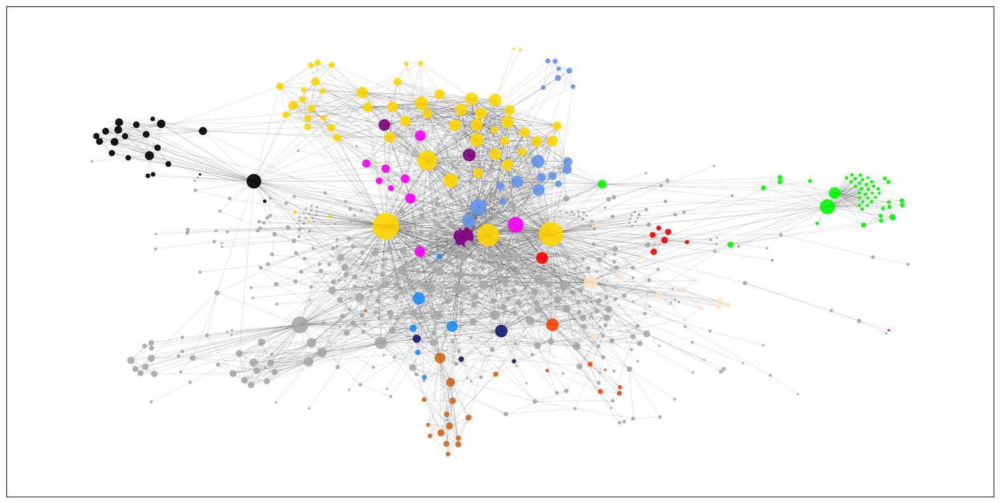

In [45]:
matplotlib.rc_file_defaults()
node_sizes = [G0.degree(node)*3 for node in G0.nodes()]
plt.rcParams["figure.figsize"] = (20,10)
nx.draw_networkx_nodes(G0.to_undirected(), positions, node_size=node_sizes, node_color=node_colors, alpha=0.9)
nx.draw_networkx_edges(G0.to_undirected(), positions, width=0.2, alpha=0.4)
plt.draw()

# Centrality Analysis (Yuting)

It is interesting to find the most central character in the network. We will find the most central character w.r.t. betweeness and closeness. 

In [46]:
from networkx.algorithms.centrality import betweenness_centrality, closeness_centrality 
from heapq import nlargest

In [47]:
betweenness = betweenness_centrality(G0)
top10_betweeness = nlargest(10, betweenness, key = betweenness.get)
print('Top 10 Betweenness Central Characters::')
for character in top10_betweeness:
    print('\t{}:{}'.format(character, round(betweenness[character], 2)))

Top 10 Betweenness Central Characters::
	Homer Simpson:0.18
	Bart Simpson:0.13
	Lisa Simpson:0.06
	Maggie Simpson:0.06
	Ned Flanders:0.06
	Marge Simpson:0.06
	Cletus Spuckler:0.06
	Charles Montgomery Burns:0.04
	Krusty the Clown:0.04
	Brandine Spuckler:0.03


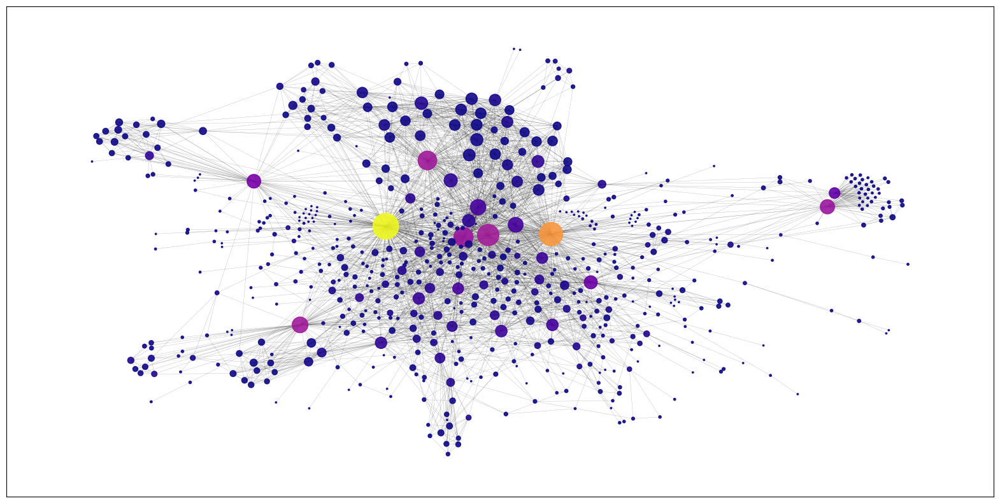

In [48]:
matplotlib.rc_file_defaults()
node_sizes = [G0.degree(node)*3 for node in G0.nodes()]
plt.rcParams["figure.figsize"] = (20,10)
nx.draw_networkx_nodes(G0.to_undirected(), positions, node_size=node_sizes, node_color=list(betweenness.values()), alpha=0.9, cmap='plasma')
nx.draw_networkx_edges(G0.to_undirected(), positions, width=0.2, alpha=0.4)
plt.draw()

In [49]:
closeness = closeness_centrality(G0)
top10_closeness = nlargest(10, closeness, key = closeness.get)
print('Top 10 Closeness Central Characters::')
for character in top10_closeness:
    print('\t{}:{}'.format(character, round(closeness[character], 2)))

Top 10 Closeness Central Characters::
	Homer Simpson:0.51
	Bart Simpson:0.49
	Lisa Simpson:0.48
	Marge Simpson:0.47
	Maggie Simpson:0.42
	Selma Bouvier:0.42
	Ned Flanders:0.42
	Moe Szyslak:0.41
	Milhouse Van Houten:0.41
	Patty Bouvier:0.4


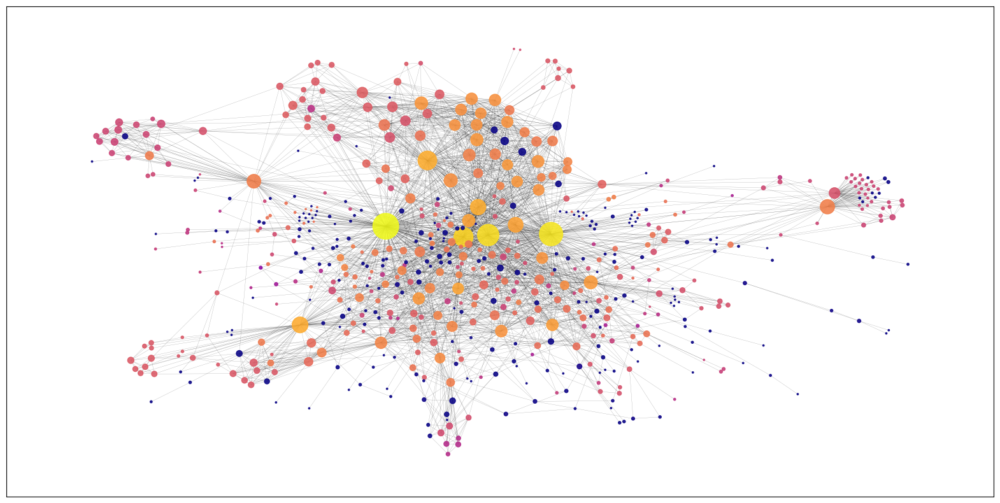

In [50]:
matplotlib.rc_file_defaults()
node_sizes = [G0.degree(node)*3 for node in G0.nodes()]
plt.rcParams["figure.figsize"] = (20,10)
nx.draw_networkx_nodes(G0.to_undirected(), positions, node_size=node_sizes, node_color=list(closeness.values()), alpha=0.9, cmap='plasma')
nx.draw_networkx_edges(G0.to_undirected(), positions, width=0.2, alpha=0.4)
plt.draw()

As the analysis shows, all members in the Simpson family are very central characters in terms of both betweenness and closeness with the most central person being Homer Simpson in both measures. This is not surprising since the show is called "The Simpsons" but it came as a surpise that Cletus and Brandine Spuckler came up as central characters w.r.t. the betweenness measure. For those that doesn't watch the show, then Cletus and Brandine are a redneck couple that has a lot of children and mostly just appears in the show during a "punch line joke". 

# TF-IDF (Edin)
### Function to Compute TF-IDF
We will for the following sections compute the TF-IDF for different groups in the network. Therefore, it is handy if we define a general function which we can use when finding the most common words. 

In [652]:
from sklearn.feature_extraction.text import TfidfVectorizer
from bs4 import BeautifulSoup
import nltk
from nltk.stem import WordNetLemmatizer 
from nltk.tokenize import WordPunctTokenizer
from nltk.corpus import stopwords
from wordcloud import WordCloud
lemmatizer=WordNetLemmatizer()

In [653]:
def compute_TF_IDF(documents):
    vectorizer = TfidfVectorizer(strip_accents='ascii', stop_words='english')
    vectors = vectorizer.fit_transform(documents)
    words = vectorizer.get_feature_names_out()
    dense = vectors.todense()
    denselist = dense.tolist()
    tf_idf = pd.DataFrame(denselist, columns=words)
    print(vectorizer.idf_)
    return tf_idf

In [481]:
def clean_html(html):
    
    if type(html) == list:
        html = ' '.join(html)
    html = re.sub("\[\[(?:[\w\s\-\,\.\']+)(?:\|[\w\s]+)?\]\]", '', html)
    html = re.sub("\[\[Category:(?:[\w\s]+)\]\]", '', html)

    soup = BeautifulSoup(html, features="html.parser")
    for script in soup(["script", "style"]):
        script.extract()
    
    text = soup.get_text()
    text = re.sub(r'[0-9]+', '', text)
    tokenizer = nltk.RegexpTokenizer(r"\w+")
    words = tokenizer.tokenize(text)
    return words

In [515]:
def group_corpus(htmls):
    common_words = ['ep', 'homer', 'simpson', 'marge', 'bart', 'ned', 'lisa', 'minor', 'cameo', 'category', 'character', 'appearance', 'selma', 'burn', 'maggie', 'bouvier', 'flanders', 'smithers', 'patty', 'png', 'jpg']
    tokens = []
    for html in htmls:
        tokens.extend(clean_html(html))
    tokens = [w.lower() for w in tokens if w.isalpha() and w not in stopwords.words('english')]
    tokens=[lemmatizer.lemmatize(w) for w in tokens]
    tokens = [w for w in tokens if w not in common_words]
    document = ' '.join(tokens)
    return document

# Community Analysis (Yuting)

In this part, we will analyze the different communities in the Simpson network which we will find by using the Louvain algorithm. The communities will be analyzed by the most frequent words used in the wiki page of the members in each community. 

In [417]:
from community import community_louvain

In [451]:
partition = community_louvain.best_partition(G0.to_undirected())
print('Number of communities:: {}'.format(max(partition.values())+1))

Number of communities:: 12


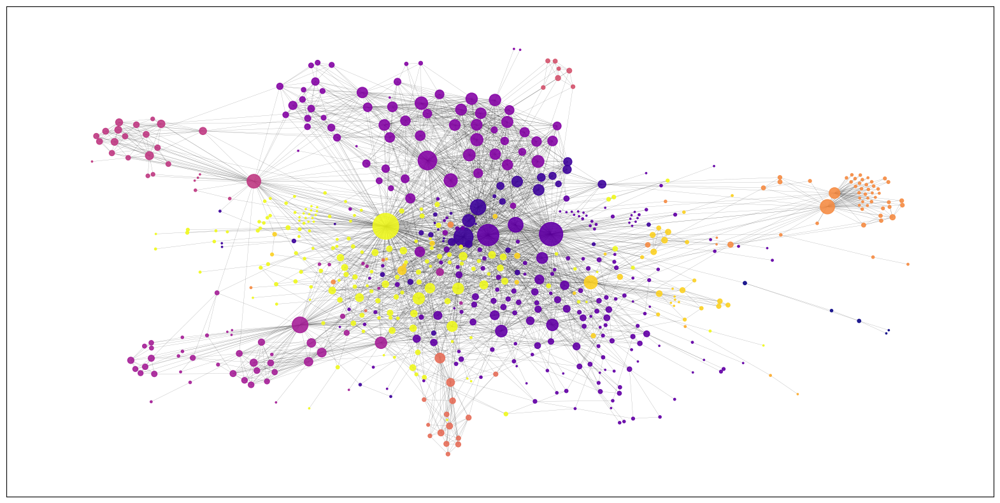

In [452]:
matplotlib.rc_file_defaults()
node_sizes = [G0.degree(node)*3 for node in G0.nodes()]
plt.rcParams["figure.figsize"] = (20,10)
nx.draw_networkx_nodes(G0.to_undirected(), positions, node_size=node_sizes, node_color=np.array(list(partition.values())) / max(partition.values()), alpha=0.9, cmap='plasma')
nx.draw_networkx_edges(G0.to_undirected(), positions, width=0.2, alpha=0.4)
plt.draw()

Running the Louvain algorithm we the 12 communities in the network. Theese are shown in the figure above where it is possible to see some (very) local communities around the network. 

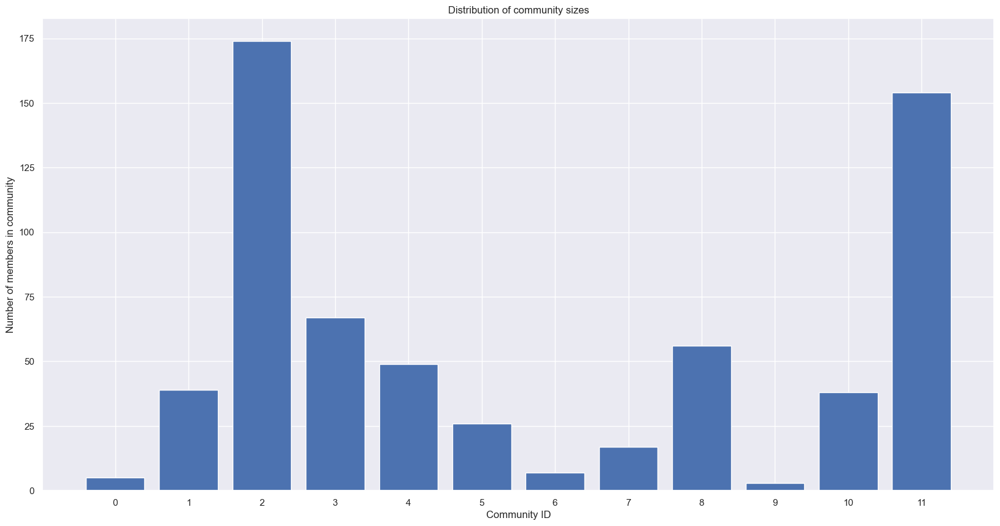

In [453]:
y = [len([1 for n in G0.to_undirected().nodes() if partition[n] == community_id]) for community_id in range(max(partition.values()) + 1)]
x = [str(i) for i in range(max(partition.values()) + 1)]
sns.set_theme()
plt.bar(x, y)
plt.xlabel("Community ID")
plt.ylabel("Number of members in community")
plt.title("Distribution of community sizes")
plt.show()

There are various sizes of the communities. Since the purpose is to compare the most common words between the communities, we will not try to shrink the sizes of community 2 and 11 which are by far the largest ones. But rather, we would like to check what the overall differences are between some communities. 

## TF-IDF

We will now compare the most common words in each of the communities by computing the TF-IDF of each of the words. Each community will have one long string representing all text from all the character's wiki pages. It was impossiblee to formulate a general expression that removed all names and odd lemmatizations, thus these were removed by trial and error manually, where these 'common non-meaningful words' are removed in the group_corpus function.  

In [520]:
communities = [[] for _ in range(max(partition.values()) + 1)]
[communities[idx].append(character) for character, idx in partition.items()]
[len(community) for community in communities]

[5, 39, 174, 67, 49, 26, 7, 17, 56, 3, 38, 154]

In [516]:
characters_df = pd.read_csv('./files/all_characters.csv')

docs = []
for community in communities:
    htmls = []
    for character in community:
        with open('files/character_description/'+re.sub(' ', '_', character)+'.txt', 'r') as f:
            character_desc = f.read().split('\n')
            htmls.append(character_desc)
    doc = group_corpus(htmls)
    docs.append(doc)

In the following cell, we are computing the TF-IDF for each word and we then print out the 10 most common words in descending order for each of the communities. 

In [517]:
df = compute_TF_IDF(docs)
for i in range(12):
    print(df.iloc[i, :].sort_values(ascending=False).index.tolist()[:10])

[1.95551145 2.87180218 2.87180218 ... 2.87180218 2.87180218 2.87180218]
['angelica', 'greystash', 'krubb', 'button', 'headmaster', 'potter', 'series', 'book', 'wizard', 'malicious']
['mcclure', 'mr', 'stu', 'hutz', 'artie', 'julio', 'isode', 'family', 'springfield', 'horror']
['school', 'seen', 'horror', 'nelson', 'skinner', 'springfield', 'treehouse', 'class', 'bob', 'friend']
['great', 'abe', 'law', 'future', 'family', 'cousin', 'zia', 'hugo', 'deceased', 'half']
['maude', 'todd', 'edna', 'hibbert', 'rod', 'seen', 'file', 'isode', 'family', 'springfield']
['mr', 'wainwright', 'lyla', 'springfield', 'montgomery', 'plant', 'bon', 'george', 'great', 'clifford']
['victor', 'great', 'yves', 'uncensored', 'mime', 'marcel', 'gauche', 'rene', 'album', 'family']
['apu', 'nahasapeemapetilon', 'octuplets', 'manjula', 'gheet', 'anoop', 'uma', 'poonam', 'pria', 'sanjay']
['spuckler', 'cletus', 'brandine', 'child', 'whitney', 'mary', 'image', 'father', 'mother', 'pig']
['esther', 'raymondo', 'creg

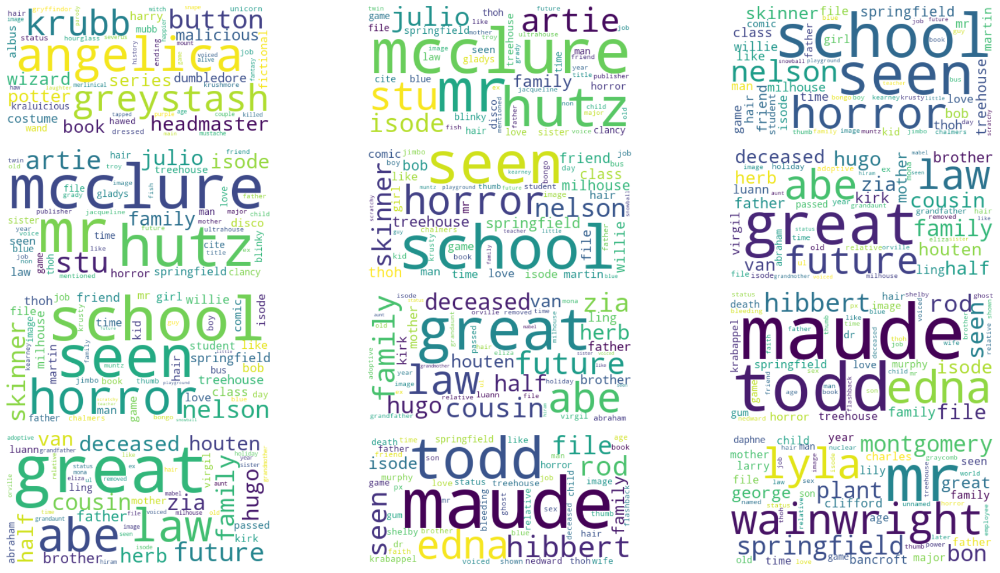

In [518]:
fig, ax = plt.subplots(nrows=4, ncols=3)

for i, row in enumerate(ax):
    for j, col in enumerate(row):
        wordcloud = WordCloud(background_color="white", max_words=50).generate_from_frequencies(df.iloc[i+j, :])
        col.imshow(wordcloud, interpolation="bilinear")
        col.axis("off")
fig.tight_layout()
plt.show()

The figures above shows the most common words based on the TF-IDF as word clouds for each of the communities. Some of them are quite meaningful whereas some of them looks to be very similar. E.g. wordcloud (2,2), (3,1) and (1,3) seems to be very school related. And thus have mentions like school, Skinner (principal), Nelson (bully) and horror (I think we all could relate back in elementary school). Moreover, we have the wordclouds (4,1), (3,2) and (2,3) which all seems to represent the old people since it contains words like deceased, family, Abe (Homer's dad) herb (natural medicine?), and law (apperantly the law is important for the old people?). The multiple occurences of the wordclouds is maybe one of the reasons why it is common practice to reduce the community sizes even futher after running the Louvain algorithm. 

## Common Categories

Remember when we mentioned that each character is categorized into different categories in their wiki pages? We will now find the longest common subset of categories in each community and see whether we can get more information about each community. 

In [545]:
for i in range(12):
    community_cats = [G.nodes[character]['categories'] for character in communities[i]]
    result = set(community_cats[0])
    for s in community_cats[1:]:
        result.intersection_update(s)
    print('Community {} :: {}'.format(i, result))

Community 0 :: {'', 'Characters'}
Community 1 :: {''}
Community 2 :: {''}
Community 3 :: {''}
Community 4 :: {''}
Community 5 :: {''}
Community 6 :: {'', 'Bouvier family', 'Mentioned characters', 'Deceased Characters', 'French characters'}
Community 7 :: {''}
Community 8 :: {''}
Community 9 :: {'', 'Tapped Out Characters', 'Adults', 'Male characters', 'Characters', 'Recurring characters'}
Community 10 :: {''}
Community 11 :: {''}


As shown above, it is only community 6 and 9 that has some meaningful common categories. If you remember the sizes of the communities, then comm 6 and 9 are two of the smaller ones which explains why there are so many common categories. But it is clear that community 6 is the Bouvier family since they have a French origin. Likewise, community 9 seems to be adult men and nothing really interesting besides that. 

# Life Phase Analysis (Yuting)

Now, we'll analyze the different stages in life in the Simpsons. We will filter out the characters to those that are eather a child, adult or senior. Hereafter, we will again do the TF-IDF of the words that are present in the wiki pages of the characters from each group. 

In [568]:
children = [character for character in characters_df.Name if 'Children' in G.nodes[character]['categories']]
adults = [character for character in characters_df.Name if 'Adults' in G.nodes[character]['categories']]
seniors = [character for character in characters_df.Name if 'Seniors' in G.nodes[character]['categories']]

In [569]:
docs = []
for community in [children, adults, seniors]:
    htmls = []
    for character in community:
        with open('files/character_description/'+re.sub(' ', '_', character)+'.txt', 'r') as f:
            character_desc = f.read().split('\n')
            htmls.append(character_desc)
    doc = group_corpus(htmls)
    docs.append(doc)

In [570]:
df = compute_TF_IDF(docs)
for i in range(3):
    print(df.iloc[i, :].sort_values(ascending=False).index.tolist()[:10])

[1.28768207 1.69314718 1.69314718 ... 1.28768207 1.69314718 1.69314718]
['school', 'seen', 'class', 'friend', 'hair', 'milhouse', 'great', 'father', 'like', 'file']
['springfield', 'mr', 'seen', 'file', 'game', 'time', 'horror', 'hair', 'isode', 'image']
['mr', 'springfield', 'great', 'file', 'family', 'law', 'abe', 'horror', 'seen', 'deceased']


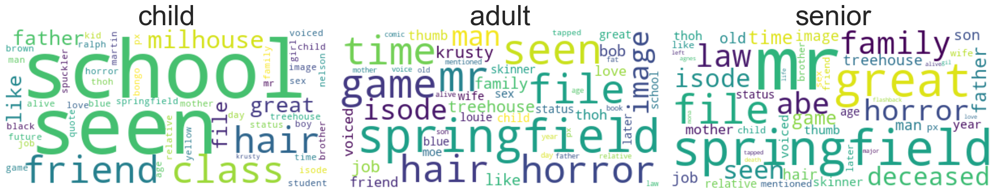

In [576]:
fig, ax = plt.subplots(nrows=1, ncols=3)
for j, col in enumerate(ax):
    wordcloud = WordCloud(background_color="white", max_words=50).generate_from_frequencies(df.iloc[j, :])
    col.imshow(wordcloud, interpolation="bilinear")
    phase = 'child' if j == 0 else 'adult' if j == 1 else 'senior'
    col.set_title(phase, fontsize=40)
    col.axis("off")
fig.tight_layout()
plt.show()

As seen above, there are some differences between the most common words used for children, adults and seniors. Children are focused on school, class and friends, which are quite innoncent things. Then the adults talk about time (perhaps always in hurry?), horror (bills and work maybe?), job, and game. Lastly, the seniors are associated with the words great, law, deceased, family mr and file. Maybe the seniors like to be called with their pronoun, that maybe explains mr? The elderly maybe also focuses more on their family since they have nothing else to do? Overall, it seems that the differenes in the different life stages in the Simpsons very well translates to the real life where we the situtation is very similar. 

In [559]:
for i, stage in enumerate([children, adults, seniors]):
    community_cats = [G.nodes[character]['categories'] for character in stage]
    result = set(community_cats[0])
    for s in community_cats[1:]:
        result.intersection_update(s)
    
    phase = 'child' if i == 0 else 'adult' if i == 1 else 'senior'
    print('Stage {} :: {}'.format(phase, result))

Stage child :: {'', 'Children'}
Stage adult :: {'', 'Adults'}
Stage senior :: {'', 'Seniors'}


The characters in the different phases doesn't seem to have any categories in common.. Except that they are in the same life stage...

# Gender Analysis (Yuting)

We have seen that the life stages seems to represent the real life very well. Maybe it will also show some differences between the men and women in the Simpsons that are similar to the ones that we see in real life?

In [577]:
men = [character for character in characters_df.Name if 'Male characters' in G.nodes[character]['categories']]
women = [character for character in characters_df.Name if 'Female characters' in G.nodes[character]['categories']]

In [578]:
docs = []
for community in [men, women]:
    htmls = []
    for character in community:
        with open('files/character_description/'+re.sub(' ', '_', character)+'.txt', 'r') as f:
            character_desc = f.read().split('\n')
            htmls.append(character_desc)
    doc = group_corpus(htmls)
    docs.append(doc)

In [579]:
df = compute_TF_IDF(docs)
for i in range(2):
    print(df.iloc[i, :].sort_values(ascending=False).index.tolist()[:10])

[1.         1.40546511 1.40546511 ... 1.40546511 1.40546511 1.40546511]
['springfield', 'file', 'mr', 'game', 'horror', 'time', 'seen', 'treehouse', 'man', 'image']
['seen', 'great', 'hair', 'school', 'springfield', 'time', 'horror', 'file', 'mr', 'isode']


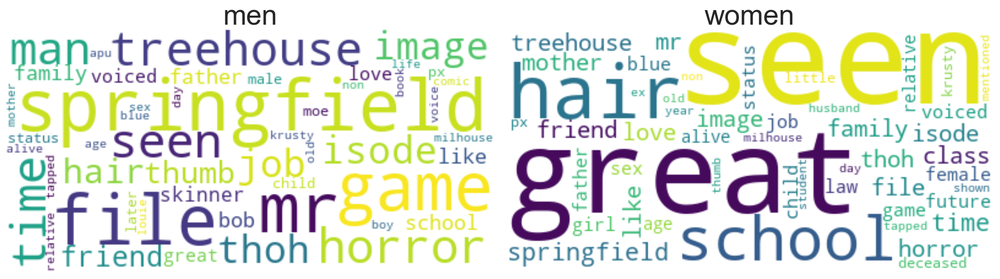

In [580]:
fig, ax = plt.subplots(nrows=1, ncols=2)
for j, col in enumerate(ax):
    wordcloud = WordCloud(background_color="white", max_words=50).generate_from_frequencies(df.iloc[j, :])
    col.imshow(wordcloud, interpolation="bilinear")
    title = 'men' if j == 0 else 'women'
    col.set_title(title, fontsize=40)
    col.axis("off")
fig.tight_layout()
plt.show()

There seems to be no clear differences beween the men and women. Maybe the women are more associated with their hair and the school of their children whereas the men tends to work more and be more focused on the time? If one has watched the series, then you would maybe have noticed that you mostly see the men working, which may explain these wordclouds. 

# Unsupervised Clustering (Edin)

In this final section we will try to do something completely else. We will use the transcript data which we introduced in the beginning and we will try to use unsupervised learning on the transcript data to group the characters based on their choice of words. Hereby, we may get groups/clusters that are not directly linked to one another. We will therefore try to find whether there are some personalities that are very similar to one another in the series. 

In [687]:
from sklearn.cluster import KMeans
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import string

In [688]:
transcript = pd.read_csv('./files/simpsons_dataset_cleaned.csv')
characters = pd.read_csv('./files/all_characters.csv')

In [689]:
transcript.head()

,Unnamed: 0,Name,spoken_words
0,0,Elizabeth Hoover,"No, actually, it was a little of both. Sometim..."
1,1,Lisa Simpson,Where's Mr. Bergstrom?
2,2,Elizabeth Hoover,I don't know. Although I'd sure like to talk t...
3,3,Lisa Simpson,That life is worth living.
4,4,Edna Krabappel,The polls will be open from now until the end ...


In [690]:
characters.head()

,Name,role,family
0,Homer Simpson,['Main Characters'],['Simpson Family']
1,Marge Simpson,['Main Characters'],"['Simpson Family', 'Bouvier Family']"
2,Bart Simpson,"['Main Characters', 'School Students']",['Simpson Family']
3,Lisa Simpson,"['Main Characters', 'School Students']",['Simpson Family']
4,Maggie Simpson,['Main Characters'],['Simpson Family']


We need to make sure that we only select the transcripts from the characters that are stored in our 'all_characters.csv' file. Moreover, we replace all the missing values (for some reason there are some) with an empty string "". 

In [691]:
transcript = transcript[transcript.Name.isin(characters.Name.tolist())]
transcript.fillna('', inplace=True)

We want to select all the lines by each character and put them together to form one long string per character. This can be done by grouping the transcript data and then join all the lines to one long string. 

In [614]:
grouped_transcripts = transcript.groupby(by='Name')

In [641]:
char_transcripts = grouped_transcripts['spoken_words'].apply(lambda transcript: ' '.join(transcript))
char_transcripts.head()

Name
Abbey                 Mummy, he's everything you said he was. Why, t...
Abraham Simpson II    Huh... who?... what? I can dress myself. Oh su...
Agnes Skinner         Oh, you must be Seymour's friend. He's up in h...
Akira                 Hello, I am Akira. HA! That didn't hurt very m...
Alaska Nebraska       Could you tell I lip-synched that whole speech...
Name: spoken_words, dtype: object

We will redefine our computation of TF_IDF so we can adjust on some parameters as well as the processing of the data. 

In [692]:
def text_process(text):
    '''
    Takes in a string of text, then performs the following:
    1. Remove all punctuation
    2. Remove all stopwords
    3. Return the cleaned text as a list of words
    4. Remove words
    '''
    stemmer = WordNetLemmatizer()
    nopunc = [char for char in text if char not in string.punctuation]
    nopunc = ''.join([i for i in nopunc if not i.isdigit()])
    nopunc =  [word.lower() for word in nopunc.split() if word not in stopwords.words('english')]
    return [stemmer.lemmatize(word) for word in nopunc]

In [694]:
def compute_TF_IDF(documents):
    vectorizer = TfidfVectorizer(analyzer=text_process, ngram_range=(1,1), max_features=5000)
    vectors = vectorizer.fit_transform(documents)
    words = vectorizer.get_feature_names_out()
    dense = vectors.todense()
    denselist = dense.tolist()
    tf_idf = pd.DataFrame(denselist, columns=words)
    return tf_idf

In [695]:
ti_idf = compute_TF_IDF(char_transcripts)
ti_idf.index = char_transcripts.index

We will determine the optimal number of clusters using the 'Elbow method'. You can read about the elbow method [here](https://www.geeksforgeeks.org/elbow-method-for-optimal-value-of-k-in-kmeans/). If you are like TL;DR, then the elbow method is essentially that we want the within-cluster squared distance to be as small as possible and thus we naively loop over different values of $k$ and emasure the within-cluster squared distance and determine where the derivative of of the squared distance is converging. I.e. we look at the squared distances as a function of $k$ and determine where the curve becomes a straight line. This is the optimal number of clusters in the data. 

In [696]:
squared_distances_summed = []
K = range(1,20)
for k in K:
    cluster = KMeans(n_clusters=k)
    cluster = cluster.fit(ti_idf)
    squared_distances_summed.append(cluster.inertia_)

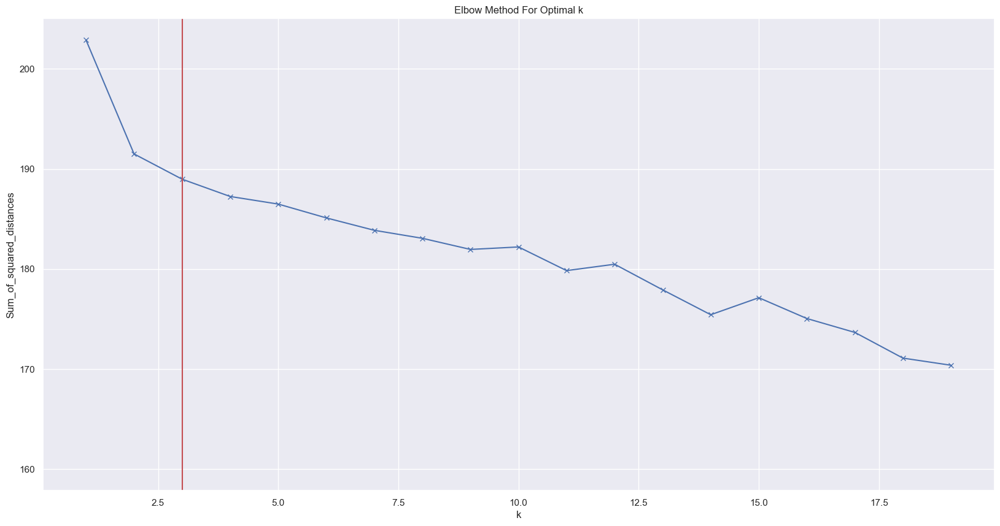

In [710]:
plt.plot(range(1,20), squared_distances_summed, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.axline((3,160), (3,200), color='r')
plt.title('Elbow Method For Optimal k')
plt.show()

Looking at the plot above, it seems that there are only between 2-4 clusters in the transcript data. We will go with 3 clusters even though we hoped for many more. We will now group each character in its respective cluster and analyze the most frequent words in each cluster. 

In [720]:
cluster = KMeans(n_clusters=3)
cluster = cluster.fit(ti_idf)
group = cluster.predict(ti_idf)
groups = dict(zip(ti_idf.index.tolist(), group))

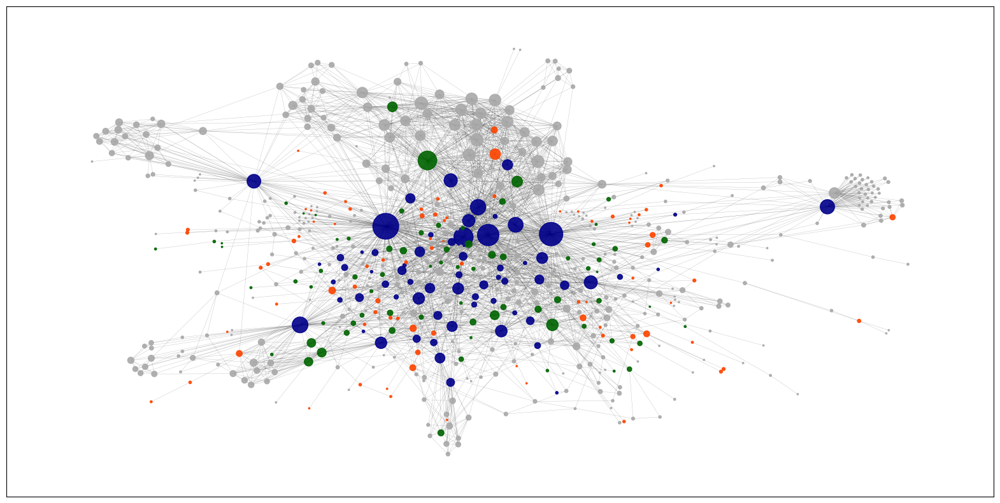

In [724]:
group_colors = ['darkgray' if node not in groups
                else 'orangered' if groups[node] == 0
               else 'darkblue' if groups[node] == 1
                else 'darkgreen' for node in G0.nodes()]
matplotlib.rc_file_defaults()
node_sizes = [G0.degree(node)*3 for node in G0.nodes()]
plt.rcParams["figure.figsize"] = (20,10)
nx.draw_networkx_nodes(G0.to_undirected(), positions, node_size=node_sizes, node_color=group_colors, alpha=0.9, cmap='plasma')
nx.draw_networkx_edges(G0.to_undirected(), positions, width=0.2, alpha=0.4)
plt.draw()

It seems that the network is grouped by how "popular" the characters are. Based on the figure above, all the bigger nodes, i.e. the nodes with a higher degree are grouped together in the blue group. The medium sized characters in the green group and and small characters in the orange group. 

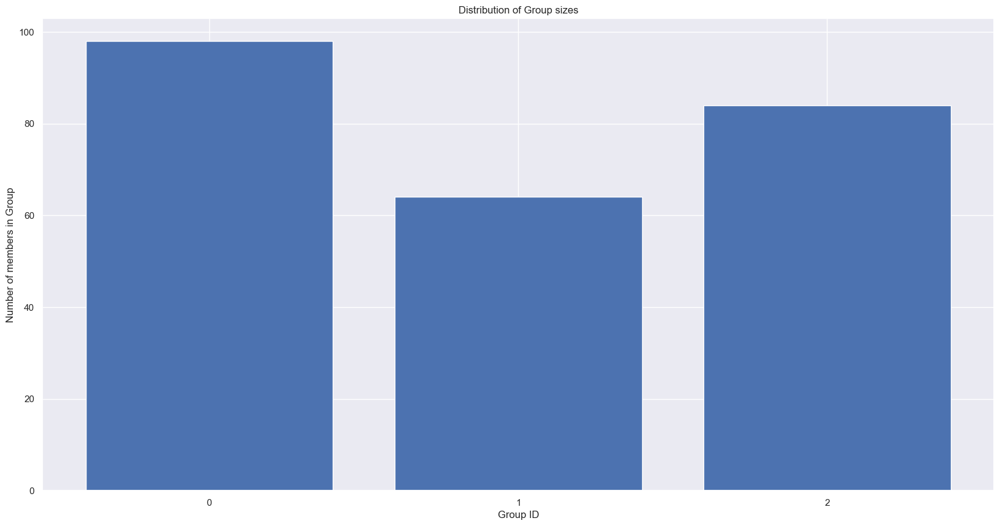

In [721]:
nodes = [node for node in groups]
y = [len([1 for n in nodes if groups[n] == group_id]) for group_id in range(max(groups.values()) + 1)]
x = [str(i) for i in range(max(groups.values()) + 1)]
sns.set_theme()
plt.bar(x, y)
plt.xlabel("Group ID")
plt.ylabel("Number of members in Group")
plt.title("Distribution of Group sizes")
plt.show()

As the figure above shows, the groups seems to be in the same size magnitude. 

## TF-IDF (On Wiki Pages)

In [725]:
group_list = [[] for _ in range(max(groups.values()) + 1)]
[group_list[idx].append(character) for character, idx in groups.items()]
[len(group) for group in group_list]

[98, 64, 84]

In [727]:
characters_df = pd.read_csv('./files/all_characters.csv')
docs = []
for group in group_list:
    htmls = []
    for character in group:
        with open('files/character_description/'+re.sub(' ', '_', character)+'.txt', 'r') as f:
            character_desc = f.read().split('\n')
            htmls.append(character_desc)
    doc = group_corpus(htmls)
    docs.append(doc)

98
64
84


In [728]:
df = compute_TF_IDF(docs)
for i in range(len(docs)):
    print(df.iloc[i, :].sort_values(ascending=False).index.tolist()[:10])

['seen', 'name', 'one', 'hair', 'image', 'file', 'voiced', 'stu', 'job', 'also']
['also', 'one', 'springfield', 'get', 'horror', 'treehouse', 'game', 'mr', 'time', 'like']
['seen', 'horror', 'one', 'also', 'treehouse', 'isode', 'game', 'thoh', 'johnny', 'springfield']


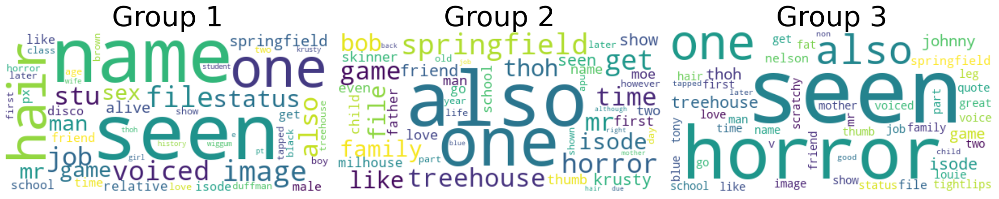

In [729]:
fig, ax = plt.subplots(nrows=1, ncols=len(docs))
for j, col in enumerate(ax):
    wordcloud = WordCloud(background_color="white", max_words=50).generate_from_frequencies(df.iloc[j, :])
    col.imshow(wordcloud, interpolation="bilinear")
    title = 'Group 1' if j == 0 else 'Group 2' if j == 1 else 'Group 3'
    col.set_title(title, fontsize=40)
    col.axis("off")
fig.tight_layout()
plt.show()

## TF-IDF (On Transcript Data)

In [734]:
docs = [' '.join(char_transcripts.loc[group]) for group in group_list]

In [735]:
df = compute_TF_IDF(docs)
for i in range(len(docs)):
    print(df.iloc[i, :].sort_values(ascending=False).index.tolist()[:10])

['i', 'oh', 'and', 'like', 'duff', 'yeah', 'im', 'disco', 'you', 'get']
['i', 'im', 'oh', 'well', 'dont', 'you', 'like', 'get', 'it', 'and']
['i', 'sir', 'you', 'im', 'haw', 'it', 'like', 'well', 'oh', 'simpson']


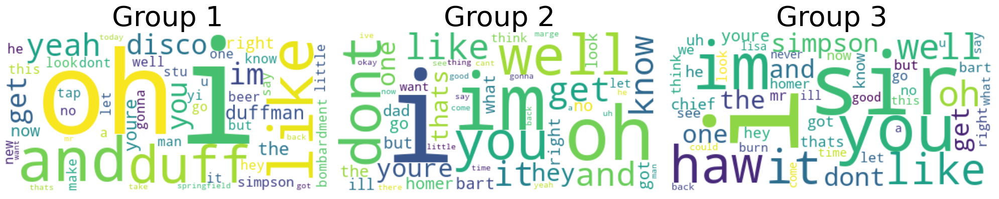

In [736]:
fig, ax = plt.subplots(nrows=1, ncols=len(docs))
for j, col in enumerate(ax):
    wordcloud = WordCloud(background_color="white", max_words=50).generate_from_frequencies(df.iloc[j, :])
    col.imshow(wordcloud, interpolation="bilinear")
    title = 'Group 1' if j == 0 else 'Group 2' if j == 1 else 'Group 3'
    col.set_title(title, fontsize=40)
    col.axis("off")
fig.tight_layout()
plt.show()

The wordclouds doesn't give us a lot of information. Mostly because the Sklearn's Tfidf_vectorizer function seems to be buggy since words like "i", "oh", "you" are repeated in all three groups. 

## Common Categories

In [730]:
for i in range(len(docs)):
    community_cats = [G.nodes[character]['categories'] for character in group_list[i]]
    result = set(community_cats[0])
    for s in community_cats[1:]:
        result.intersection_update(s)
    print('Group {} :: {}'.format(i+1, result))

Group 1 :: {''}
Group 2 :: {''}
Group 3 :: {''}


Again, we see that no categories are common throughout the whole group. This is very likely due to the group sizes so unfortunately we haven't been able to see some pattern in terms of categorizations. 

# Conclusion (Edin)

The project was about finding similarities between the Simpsons and the real life. Mostly because we went with the hypothesis that the Simpson represents the typical American life and thus the show should contain communities, personalities and problems as we face in the real life in different stages in life.

After doing an analysis between the different communities, genders, life phases and personality grouping, we really couldn't find any significant resemblance of real life using the word clouds, which are determined using the TF-IDF measure. The TF-IDF function from the Sklearn library didn't produce any trustworthy results and one could suspect that they have implemented the IDF function poorly since the function returned words that are frequent throughout all documents. We did however try to use our own implemented TF-IDF function but these returned only the names of the characters that are in the subgroups that we were analyzing which also is not useful to do any comparison. And we did try to remove these names by removing all links in the wiki pages but some of them are also written outside the hyperlinks. 

Moreover, we hoped that the transcript data would give us more insight about the characters in the show. And therefore also expected to have a lot of clusters that can be made based on the choice of words between the characters. However, we found that there are only 2-4 clusters in the data. And doing any comparison between the most common words, both wiki pages and transcript data, also didn't give any new insight to the many different subgroups in the Simpsons universe. 

In the future, we should do a much better text processing of the wiki pages and maybe find some way of removing words that are not meaningful such as names, pronouns and maybe some more types of words. 